In [1]:
import mne
import os
import os.path as op
import numpy as np
import pickle
from warnings import filterwarnings
from sys import argv
import matplotlib.pyplot as plt
from stormdb.access import Query
import pandas as pd
from src.preprocessing import WM_epoching, main_task_events_fun, default_events_fun
filterwarnings("ignore", category=DeprecationWarning)

In [17]:
project = 'MINDLAB2020_MEG-AuditoryPatternRecognition'
project_dir = '/projects/' + project
os.environ['MINDLABPROJ']= project
#os.environ['MNE_ROOT']='/users/david/miniconda3/envs/mne3d' # for surfer
os.environ['MESA_GL_VERSION_OVERRIDE'] = '3.2'

raw_path = project_dir + '/scratch/maxfiltered_data/tsss_st16_corr96'
ica_path = project_dir + '/scratch/working_memory/ICA'
avg_path = project_dir + '/scratch/working_memory/averages'
log_path = project_dir + '/misc/working_memory_logs'

subjects_dir = project_dir + '/scratch/fs_subjects_dir'
fwd_path = project_dir + '/scratch/forward_models'

qy = Query(project)
subs = qy.get_subjects()
scode = 21
# if len(argv) > 1:
#     scode = int(argv[1])

sub = subs[scode-1] #'0002_BYG'#'0002_BYG'#'0008_HMD'#'0002_BYG'
conds_orig = ['main','inv'] #  ['mainv2','invv2']
conds = ['maintenance','manipulation']
lnames = ['recognize','invert']
save_averages = True#False#True
plot_topo = True#True
compute_sources = True # False
plot_sources = False
# sub, conds, save_averages,  = argv[0], argv[1], argv[2]
# plot_topo, compute_sources, plot_sources = argv[3], argv[4]


In [54]:
## Alternative epoching strategy
tmin = -.1
tmax = 6.5
reject = dict(mag = 4e-12, grad = 4000e-13)
epochs = {}
evokeds = {}
print('\n epoching \n')
for cidx, c in enumerate(conds_orig):
    nc = conds[cidx]
    fname = os.path.join(raw_path, sub, c + '_raw_tsss.fif')
    icaname = os.path.join(ica_path,sub, c + '_raw_tsss-ica.fif')
    lfname = op.join(log_path, sub[0:4] + '_' + lnames[cidx] + '_MEG.csv')
    epochs[nc] = WM_epoching(data_path=fname, ica_path=icaname, tmin=-1, tmax=6.5,
                                l_freq=.05, h_freq=40, resample = 100, bads=[],
                                baseline=(-1,0), notch_filter=50,
                                events_fun=main_task_events_fun, events_fun_kwargs = {'cond': nc, 'lfname': lfname},
                                reject=reject)


 epoching 

Opening raw data file /projects/MINDLAB2020_MEG-AuditoryPatternRecognition/scratch/maxfiltered_data/tsss_st16_corr96/0021_LZW/main_raw_tsss.fif...
    Range : 7000 ... 602999 =      7.000 ...   602.999 secs
Ready.
Reading 0 ... 595999  =      0.000 ...   595.999 secs...
Reading /projects/MINDLAB2020_MEG-AuditoryPatternRecognition/scratch/working_memory/ICA/0021_LZW/main_raw_tsss-ica.fif ...
Now restoring ICA solution ...
Ready.
Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 3 ICA components
    Projecting back using 306 PCA components
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.6

In [55]:
epochs = mne.concatenate_epochs([epochs[e] for e in epochs])

Not setting metadata
Not setting metadata
118 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped


In [62]:
epochs

Number of events,118
Events,maintenance/mel1/diff1: 8maintenance/mel1/diff2: 7maintenance/mel1/same: 15maintenance/mel2/diff1: 7maintenance/mel2/diff2: 7maintenance/mel2/same: 15manipulation/mel1/inv: 15manipulation/mel1/other1: 7manipulation/mel1/other2: 7manipulation/mel2/inv: 15manipulation/mel2/other1: 8manipulation/mel2/other2: 7
Time range,-1.000 – 6.500 sec
Baseline,-1.000 – 0.000 sec


In [56]:
evokeds = {e: epochs[e].average() for e in epochs.event_id}

In [57]:
other_conds = ['maintenance','manipulation','mel1','mel2','maintenance/mel1','maintenance/mel2','manipulation/mel1','manipulation/mel2']
for oc in other_conds:
    evokeds[oc] = epochs[oc].average()
    evokeds[oc].comment = oc

In [58]:
evokeds_diff = {'melody': ['mel2','mel1'], 'block': ['manipulation','maintenance'],
                'melody_maintenance': ['maintenance/mel2','maintenance/mel1'],
                'melody_manipulation': ['manipulation/mel2','manipulation/mel1'],
                'interaction': ['melody_maintenance','melody_manipulation']}

for e in evokeds_diff:
    e2, e1 = evokeds_diff[e]
    evokeds[e] = mne.combine_evoked([evokeds[e2],evokeds[e1]],weights=[1,-1])
    evokeds[e].comment = e

In [59]:
plot_conds = {'all': ['maintenance','manipulation'],
              'block_diff': ['block'],
              'mel_diff': ['melody_maintenance','melody_manipulation'],
              'interaction': ['interaction']}

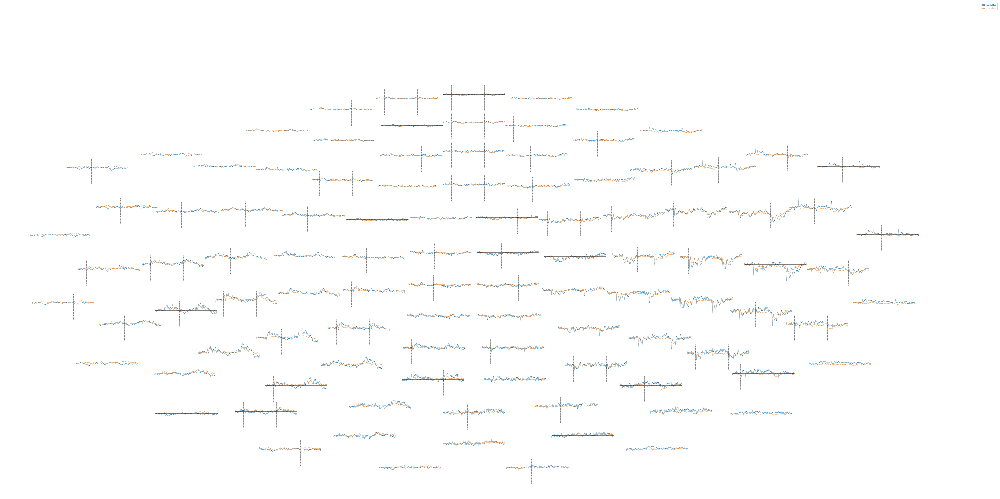

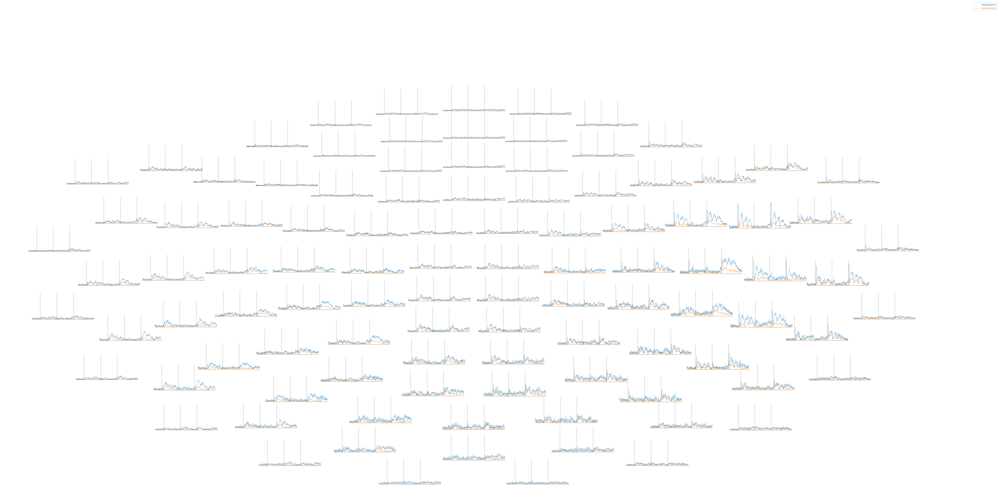

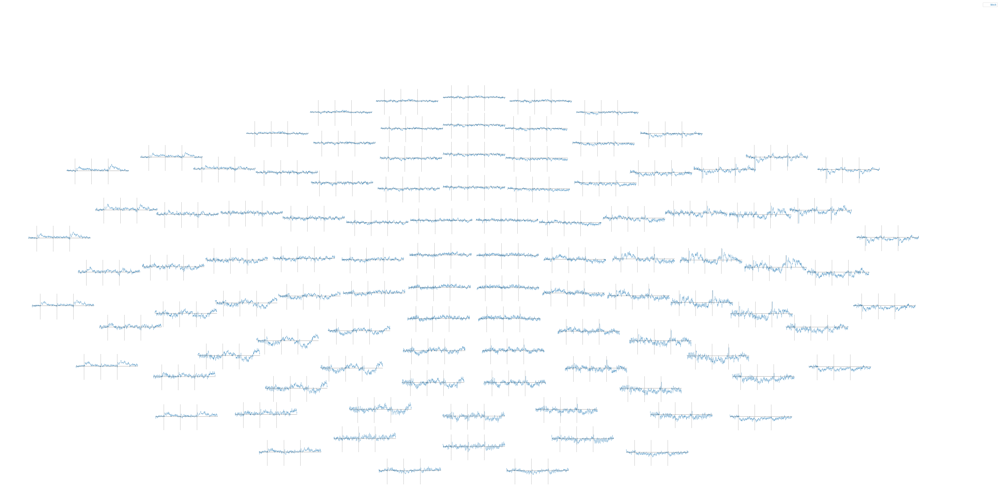

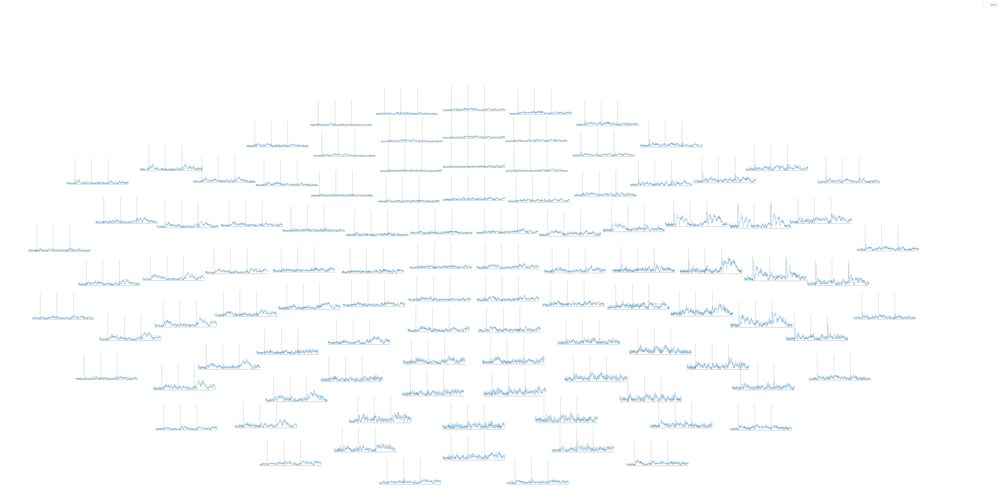

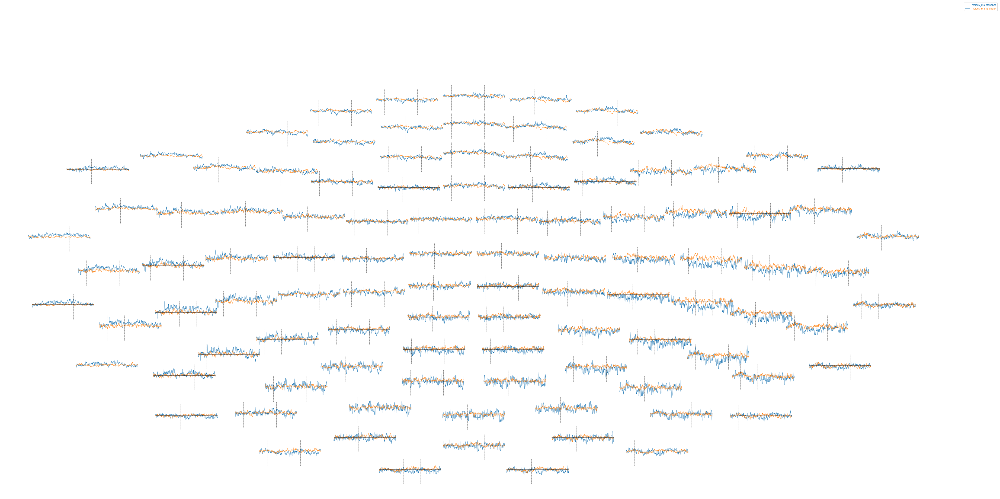

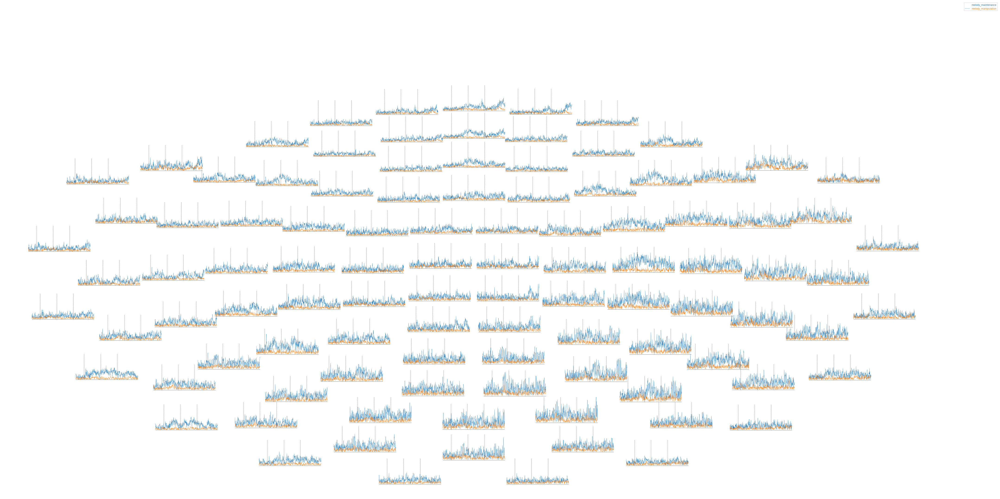

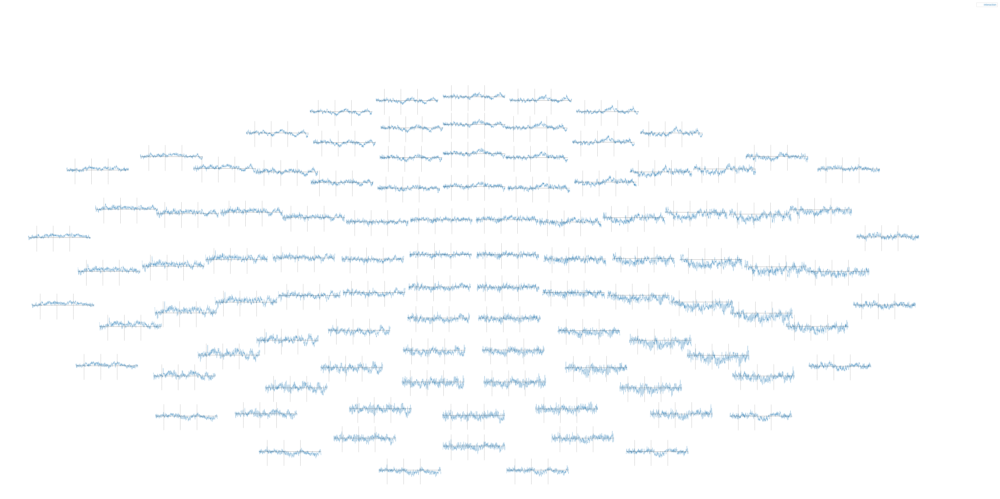

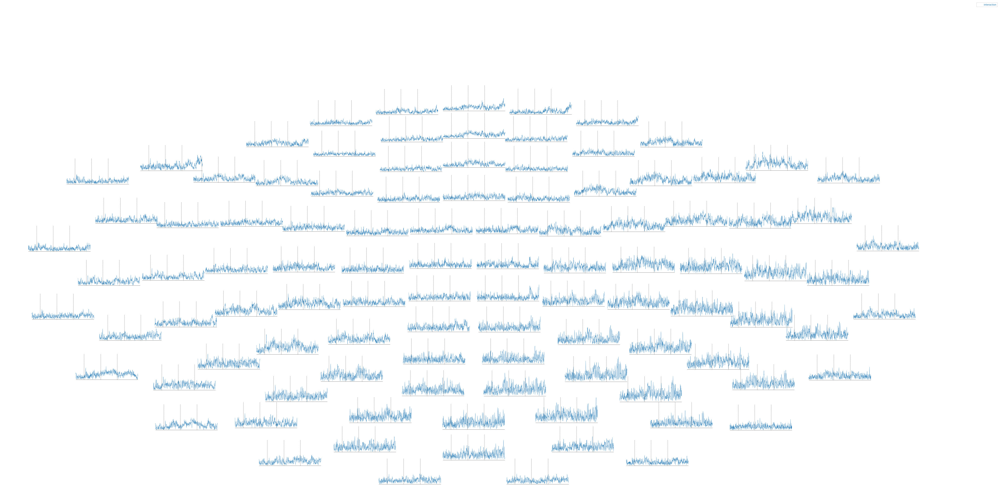

In [60]:
ctypes = ['mag','grad']
for pc in plot_conds:
    for t in ctypes:
        merge_grads = False
        if t == 'grad':
            merge_grads = True
        fig, axis = plt.subplots(nrows=1,ncols=1,figsize=(60,30))
        mne.viz.plot_evoked_topo([evokeds[e].copy().pick_types(t) for e in plot_conds[pc]],
                               axes = axis,merge_grads=merge_grads,show=False, vline = [0,2,4])
        plt.tight_layout()
        fig.savefig(avg_path + '/figures/{}/{}_ERFs_topo_{}_{}.pdf'.format(sub,sub,pc,t))


In [61]:
compute_sources = True
if compute_sources:
    print('\n computing sources \n')
    fwd_fn = op.join(fwd_path, sub + '_vol-fwd.fif')
    fwd = mne.read_forward_solution(fwd_fn)
    #compute noise covariance
    noise_cov = mne.compute_covariance(epochs,tmin = -1,
                                       tmax=0, rank='info')
    data_cov = mne.compute_covariance(epochs.load_data().copy().pick_types('mag'),
                                       tmin= -1,
                                       tmax = 6.5,rank ='info')
    ## mne solution
    inv = mne.beamformer.make_lcmv(epochs.info,fwd,data_cov, reg=0.05,
                                    pick_ori='max-power', #noise_cov=noise_cov,#,depth = 0.95,
                                    weight_norm= 'nai', rank = 'info')
    # inv = mne.minimum_norm.make_inverse_operator(epochs[conds[0]].info,fwd,
    #                                               noise_cov,loose = 1)
    SNR = 3
    sources = {}
    for e in evokeds:
        sources[e] = {}
        for c in evokeds[e]:
            # sources[e][c] = mne.minimum_norm.apply_inverse(evokeds[e][c],inv,
            #                                                 lambda2=1/SNR**2)
            sources[e][c] = mne.beamformer.apply_lcmv(evokeds[e][c],inv)#,max_ori_out='signed')

            # if plot_sources:
            #     brain = sources[e][c].plot(subjects_dir=subjects_dir,initial_time=-1,hemi = 'split',
            #                                time_viewer=True, views=['lateral','medial'],
            #                                title = 'ERF- {} {} {}'.format(sub,e,c))
            #     # brain.save_movie(avg_path + '/figures/{}_ERF_sources_{}_{}.mov'.format(sub,e,c),
            #     #                 framerate=4,time_dilation = 10)
            #     brain.close()

    src_fname = op.join(avg_path,'data',sub,sub + '_evoked_sources.p')
    src_file = open(src_fname,'wb')
    pickle.dump(sources,src_file)
    src_file.close()

    inv_fname = op.join(avg_path,'data',sub,sub + '_evoked_inverse.p')
    inv_file = open(inv_fname,'wb')
    pickle.dump(inv,inv_file)
    inv_file.close()
    print('\n sources file saved')


 computing sources 

Reading forward solution from /projects/MINDLAB2020_MEG-AuditoryPatternRecognition/scratch/forward_models/0021_LZW_vol-fwd.fif...
    Reading a source space...
    [done]
    1 source spaces read
    Desired named matrix (kind = 3523) not available
    Read MEG forward solution (12678 sources, 306 channels, free orientations)
    Source spaces transformed to the forward solution coordinate frame


IndexError: arrays used as indices must be of integer (or boolean) type

No projector specified for this dataset. Please consider the method self.add_proj.


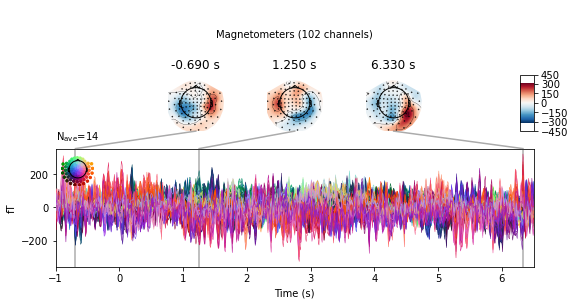

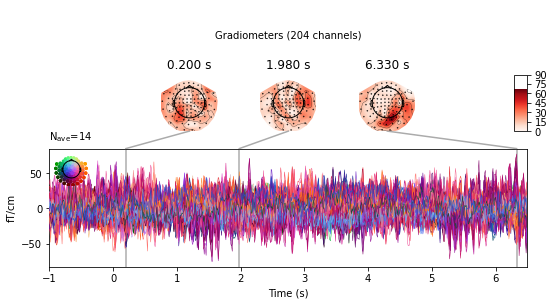

No projector specified for this dataset. Please consider the method self.add_proj.


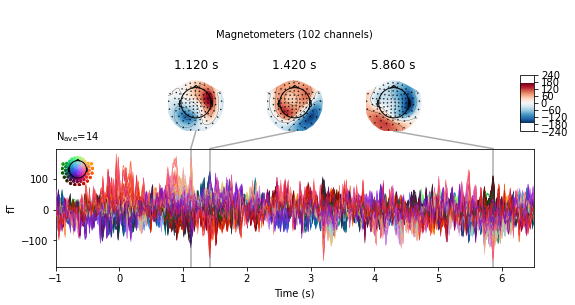

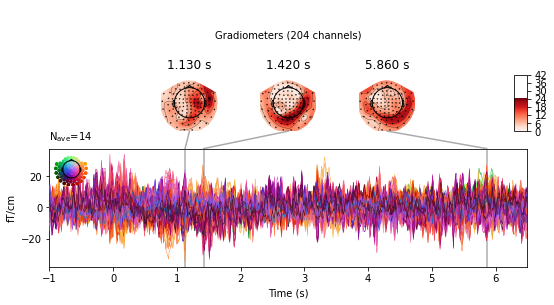

No projector specified for this dataset. Please consider the method self.add_proj.


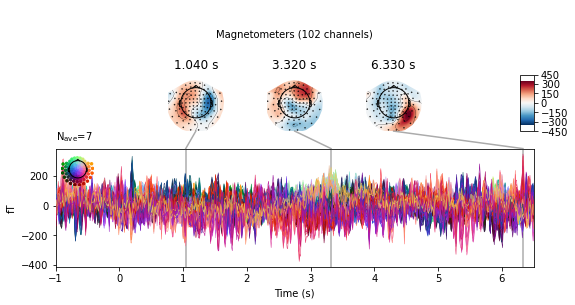

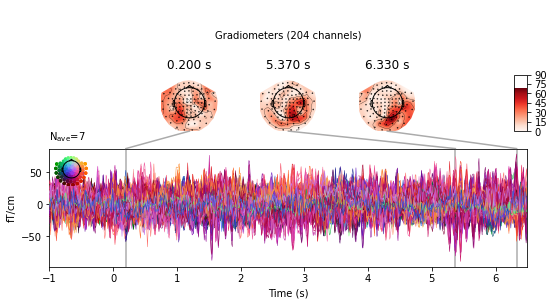

[<Figure size 576x302.4 with 7 Axes>, <Figure size 576x302.4 with 7 Axes>]

In [26]:
evokeds['melody_maintenance'].plot_joint()
evokeds['melody_manipulation'].plot_joint()
evokeds['interaction'].plot_joint()

In [5]:
# create melody specific codes
# Recode melody 1 and 2
class_labels = [((ll // 10) - 1) % 2 for ll in epochs.events[:,2]]
print('comparing triggers and class labels')
for x,y in zip(class_labels, epochs.events[:,2]):
    print(y,x)

comparing triggers and class labels
13 0
12 0
11 0
11 0
21 1
23 1
23 1
12 0
21 1
12 0
11 0
21 1
12 0
22 1
22 1
21 1
11 0
13 0
13 0
22 1
22 1
13 0
13 0
23 1
21 1
23 1
23 1
21 1
11 0
11 0
23 1
12 0
21 1
23 1
21 1
22 1
12 0
21 1
11 0
21 1
21 1
11 0
22 1
11 0
13 0
22 1
21 1
11 0
11 0
31 0
31 0
31 0
42 1
42 1
42 1
42 1
41 1
41 1
33 0
41 1
43 1
33 0
41 1
41 1
33 0
42 1
41 1
43 1
41 1
31 0
31 0
32 0
32 0
31 0
32 0
43 1
41 1
33 0
41 1
42 1
33 0
32 0
31 0
31 0
32 0
33 0
41 1
41 1
41 1
31 0
41 1
43 1
31 0
41 1
42 1
33 0
41 1
43 1
31 0
31 0
42 1
31 0
32 0
43 1
43 1
33 0
